# Trabajo Práctico número 3

Integrantes
- Gaspar Acevedo Zain (acevedo.zain.gaspar@gmail.com)

## Carga de utilities

In [1]:
import cv2 as cv
import matplotlib.pyplot as plt
import supervision as sv
%matplotlib inline

In [2]:
import sys
import os

sys.path.append(os.path.abspath(os.path.join(os.getcwd(), "../")))

from utilities.template_matching import PreprocessingData, TemplateMatching

# Enunciado

Encontrar el logotipo de la gaseosa dentro de las imágenes provistas en  
Material_TPs/TP3/images a partir del template Material_TPs/TP3/template
1. Obtener una detección del logo en cada imagen sin falsos positivos
2. Plantear y validar un algoritmo para múltiples detecciones en la imagen
coca_multi.png con el mismo témplate del ítem 1
3. Generalizar el algoritmo del item 2 para todas las imágenes.
Visualizar los resultados con bounding boxes en cada imagen mostrando el nivel de confianza
de la detección.

# Punto 2

Plantear y validar un algoritmo para múltiples detecciones en la imagen
coca_multi.png con el mismo témplate del ítem 1

## Carga de template

In [3]:
template_path = "./material/template/pattern.png"

template = cv.imread(template_path)
templateRGB = cv.cvtColor(template, cv.COLOR_BGR2RGB)
templateGrayScale = cv.cvtColor(template, cv.COLOR_BGR2GRAY)

## Carga de imagen objetivo

In [4]:
img_multi_path = "./material/images/coca_multi.png"

imgMulti = cv.imread(img_multi_path)
imgMultiRGB = cv.cvtColor(imgMulti, cv.COLOR_BGR2RGB)
imgMultiGrayScale = cv.cvtColor(imgMulti, cv.COLOR_BGR2GRAY)

## Preprocesamiento - Análisis

### Análisis del Template

En esta sección se realizarán un análisis y preprocesamiento del *template*.

En particular, se estudiará como es afectado por un detector de *bordes* de *Canny*, como así también cuales son los resultados al aplicar *pirámides Gaussianas* de nivel $1$, $2$ y $3$.

#### Gráfico de imágenes

Se comienza mostrando los templates:

Text(0.5, 1.0, 'Template GrayScale')

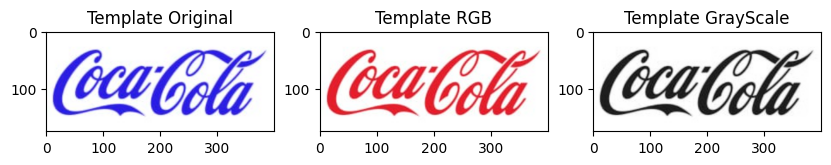

In [5]:
fig = plt.figure(figsize=(10,5))
ax1 = plt.subplot(131)
ax1.imshow(template)
ax1.set_title("Template Original")

ax2 = plt.subplot(132)
ax2.imshow(templateRGB)
ax2.set_title("Template RGB")

ax3 = plt.subplot(133)
ax3.imshow(templateGrayScale, cmap="gray")
ax3.set_title("Template GrayScale")

#### Detector de bordes de Canny

***Detector de bordes de Canny***

Sobre el template se aplica un detector de bordes de *Canny* utilizando los siguientes *thresholds*:

1. *lower*: $5$ - *upper* $100$.
1. *lower*: $5$ - *upper* $250$.
1. *lower*: $5$ - *upper* $500$.

Al graficar, se observa que al aplicar los thresholds listados en $1$, se detectan *bordes* erróneos (en las letras $C$ y $a$ de la palabra *Cola*).

En los otros dos casos **NO** sucede lo mismo, así que son los valores *candidatos* a la hora de aplicar *Canny* sobre el *template*.

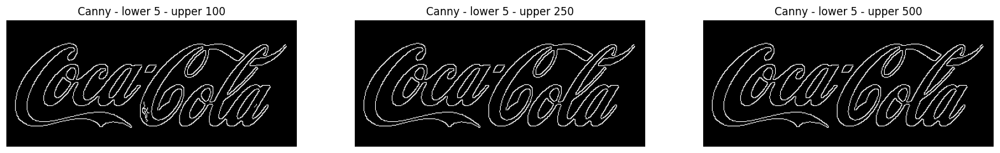

In [6]:
canny_5_x_100 = cv.Canny(templateGrayScale, threshold1=5, threshold2=100)
canny_5_x_250 = cv.Canny(templateGrayScale, threshold1=5, threshold2=250)
canny_5_x_500 = cv.Canny(templateGrayScale, threshold1=5, threshold2=500)
sv.plot_images_grid(
    images=[canny_5_x_100, canny_5_x_250, canny_5_x_500],
    titles=["Canny - lower 5 - upper 100", "Canny - lower 5 - upper 250", "Canny - lower 5 - upper 500"],
    grid_size=(1 ,3),
    size=(20,20)
)

#### Pirámides Gaussianas

***Pirámides Gaussianas***

Se estudian pirámides gaussianas de nivel $1$ ($original / 2$), $2$ ($original / 4$) y $3$ ($original / 8$) sobre el template en escala de grises:

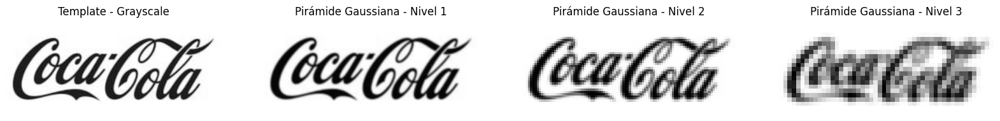

Dimensiones de la imagen original: (175, 400)
Dimensiones de la pirámide gaussiana de Nivel 1: (88, 200)
Dimensiones de la pirámide gaussiana de Nivel 2: (44, 100)
Dimensiones de la pirámide gaussiana de Nivel 3: (22, 50)


In [7]:
gaussian_nivel_1 = cv.pyrDown(templateGrayScale)
gaussian_nivel_2 = cv.pyrDown(gaussian_nivel_1)
gaussian_nivel_3 = cv.pyrDown(gaussian_nivel_2)

sv.plot_images_grid(
    images=[templateGrayScale, gaussian_nivel_1, gaussian_nivel_2, gaussian_nivel_3],
    titles=["Template - Grayscale", "Pirámide Gaussiana - Nivel 1", "Pirámide Gaussiana - Nivel 2", "Pirámide Gaussiana - Nivel 3"],
    grid_size=(1 ,4),
    size=(20,20)
)

print(f"Dimensiones de la imagen original: {templateGrayScale.shape}")
print(f"Dimensiones de la pirámide gaussiana de Nivel 1: {gaussian_nivel_1.shape}")
print(f"Dimensiones de la pirámide gaussiana de Nivel 2: {gaussian_nivel_2.shape}")
print(f"Dimensiones de la pirámide gaussiana de Nivel 3: {gaussian_nivel_3.shape}")

#### Bordes de Canny y pirámides Gaussianas

***Canny y Pirámides Gaussianas***

En esta sección se estudia la combinación de las técnicas de detector de bordes de *Canny* junto a *pirámides Gaussianas*.

En la primer celda se estudian las pirámides gaussianas de nivel $1$, $2$ y $3$ sobre el resultado de aplicar *Canny* con *lower threshold* de $5$ y *upper threshold* $250$.

En la segunda celda, se estudian los mismos niveles de pirámides gaussianas pero sobre el resultado de aplicar *Canny* con *lower threshold* de $5$ y *upper threshold* $500$.

***Resultados***

En ambos casos se nota que la pirámide gaussiana de nivel $3$ presenta un resultado muy *distorsinado*, lo cual podría ser poco útil para *template matching*.

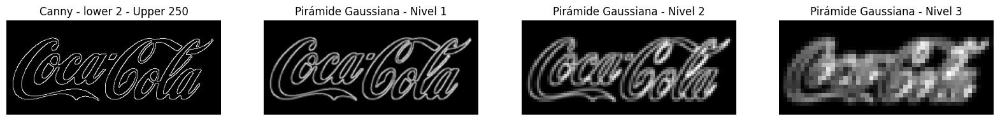

Dimensiones de la imagen original: (175, 400)
Dimensiones de la pirámide gaussiana de Nivel 1: (88, 200)
Dimensiones de la pirámide gaussiana de Nivel 2: (44, 100)
Dimensiones de la pirámide gaussiana de Nivel 3: (22, 50)


In [8]:
gaussian_nivel_1 = cv.pyrDown(canny_5_x_250)
gaussian_nivel_2 = cv.pyrDown(gaussian_nivel_1)
gaussian_nivel_3 = cv.pyrDown(gaussian_nivel_2)

sv.plot_images_grid(
    images=[canny_5_x_250, gaussian_nivel_1, gaussian_nivel_2, gaussian_nivel_3],
    titles=["Canny - lower 2 - Upper 250", "Pirámide Gaussiana - Nivel 1", "Pirámide Gaussiana - Nivel 2", "Pirámide Gaussiana - Nivel 3"],
    grid_size=(1 ,4),
    size=(20,20)
)

print(f"Dimensiones de la imagen original: {canny_5_x_250.shape}")
print(f"Dimensiones de la pirámide gaussiana de Nivel 1: {gaussian_nivel_1.shape}")
print(f"Dimensiones de la pirámide gaussiana de Nivel 2: {gaussian_nivel_2.shape}")
print(f"Dimensiones de la pirámide gaussiana de Nivel 3: {gaussian_nivel_3.shape}")

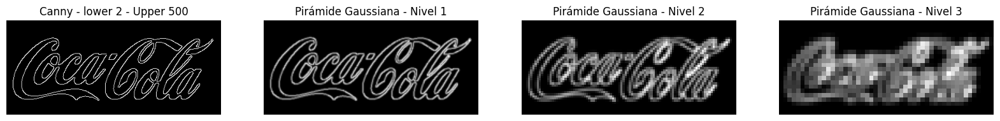

Dimensiones de la imagen original: (175, 400)
Dimensiones de la pirámide gaussiana de Nivel 1: (88, 200)
Dimensiones de la pirámide gaussiana de Nivel 2: (44, 100)
Dimensiones de la pirámide gaussiana de Nivel 3: (22, 50)


In [9]:
gaussian_nivel_1 = cv.pyrDown(canny_5_x_500)
gaussian_nivel_2 = cv.pyrDown(gaussian_nivel_1)
gaussian_nivel_3 = cv.pyrDown(gaussian_nivel_2)

sv.plot_images_grid(
    images=[canny_5_x_500, gaussian_nivel_1, gaussian_nivel_2, gaussian_nivel_3],
    titles=["Canny - lower 2 - Upper 500", "Pirámide Gaussiana - Nivel 1", "Pirámide Gaussiana - Nivel 2", "Pirámide Gaussiana - Nivel 3"],
    grid_size=(1 ,4),
    size=(20,20)
)

print(f"Dimensiones de la imagen original: {canny_5_x_500.shape}")
print(f"Dimensiones de la pirámide gaussiana de Nivel 1: {gaussian_nivel_1.shape}")
print(f"Dimensiones de la pirámide gaussiana de Nivel 2: {gaussian_nivel_2.shape}")
print(f"Dimensiones de la pirámide gaussiana de Nivel 3: {gaussian_nivel_3.shape}")

#### Conclusiones del preprocesamiento sobre el template

Se estudiaron diversas configuraciones de bordes de *canny* sobre una imagen en *escala de grises*, modificando los *lower* y *upper* thresholds. <br/>
Al graficarlos, se nota que los que mejor resultados tienen son los que utilizan un *lower* threshold de $50$. <br/>
Respecto al *upper* threshold, los mejores resultados se obtienen al utilizar valores de $250$ y $500$. <br/>
Se opta por utilizar el valor $500$, ya que el umbral será mayor.

Se estudió el uso de *pirámides gaussianas* sobre una imagen procesado con bordes de *Canny*. <br/>
Los niveles estudiados fueron $1$ ($imagen\_original/2$), $2$ ($imagen\_original/4$) y $3$ ($imagen\_original/8$). <br/>
Se observó que las imágenes de nivel $3$ estaban muy distorsionadas, lo cual podría presentar problemas al implementarse en template matching. <br/>
Se opta entonces en utilizar pirámides gaussianas de nivel $2$, ya que no presentan tanta distorsión, y la dimensión final ($44, 100$) es la cuarta parte de la dimensión original del template ($175, 400$), la cual es ideal ya que en la imagen objetivo nuestro template aparece en un tamaño relativamente pequeño.

En conclusión, estos son los pasos a realizar para configurar nuestro ***template***:
1. Convertir a escala de grises el template.
1. Implementar bordes de *Canny* *lower threshold* de $5$ y *upper threshold* $500$.
1. Implementar pirámides gaussianas de nivel $2$,

### Análisis de imagen objetivo

En esta sección se realizarán un análisis y preprocesamiento de nuestra imagen objetivo o *target*: `coca_multi.png`.

Se opta por no estudiar el uso de *pirámides Gaussianas*, ya que esto implica reducir la imagen objetivo. Debido a esto, el template debería ser más pequeño, lo cual podría implicar usar niveles mayores a $2$, y en la sección anterior se detectó que estos niveles distorsionan demasiado a nuestro *template*.

#### Gráfico de imágenes

Text(0.5, 1.0, 'Imagen - GrayScale')

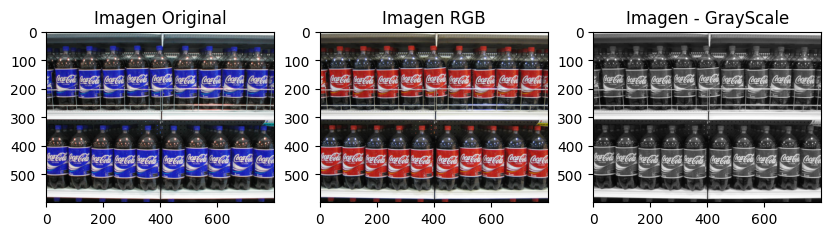

In [10]:
fig = plt.figure(figsize=(10,5))
ax1 = plt.subplot(131)
ax1.imshow(imgMulti)
ax1.set_title("Imagen Original")

ax2 = plt.subplot(132)
ax2.imshow(imgMultiRGB)
ax2.set_title("Imagen RGB")

ax3 = plt.subplot(133)
ax3.imshow(imgMultiGrayScale, cmap="gray")
ax3.set_title("Imagen - GrayScale")

#### Detector de bordes de Canny

***Detector de bordes de Canny***

Sobre la imagen en escala de grises se aplica un detector de bordes de *Canny* utilizando los siguientes *thresholds*:

1. *lower*: $5$ - *upper* $100$.
1. *lower*: $5$ - *upper* $250$.
1. *lower*: $5$ - *upper* $500$.

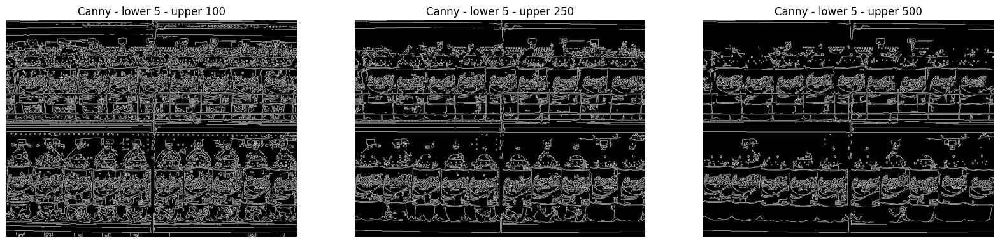

In [11]:
canny_5_x_100 = cv.Canny(imgMultiGrayScale, threshold1=5, threshold2=100)
canny_5_x_250 = cv.Canny(imgMultiGrayScale, threshold1=5, threshold2=250)
canny_5_x_500 = cv.Canny(imgMultiGrayScale, threshold1=5, threshold2=500)
sv.plot_images_grid(
    images=[canny_5_x_100, canny_5_x_250, canny_5_x_500],
    titles=["Canny - lower 5 - upper 100", "Canny - lower 5 - upper 250", "Canny - lower 5 - upper 500"],
    grid_size=(1 ,3),
    size=(20,20)
)

Dado a que queremos detectar el logo de *Coca-Cola*, los mejores resultados al aplicar detector de bordes de *Canny* son los que utilizan un *upper threshold* de $250$ y $500$.

A continuación, se hará otro análisis utilizando un *upper threshold* de $500$ y diferentes *lower thresholds*, para determinar cuáles son los mejores parámetros para nuestro caso de estudio.

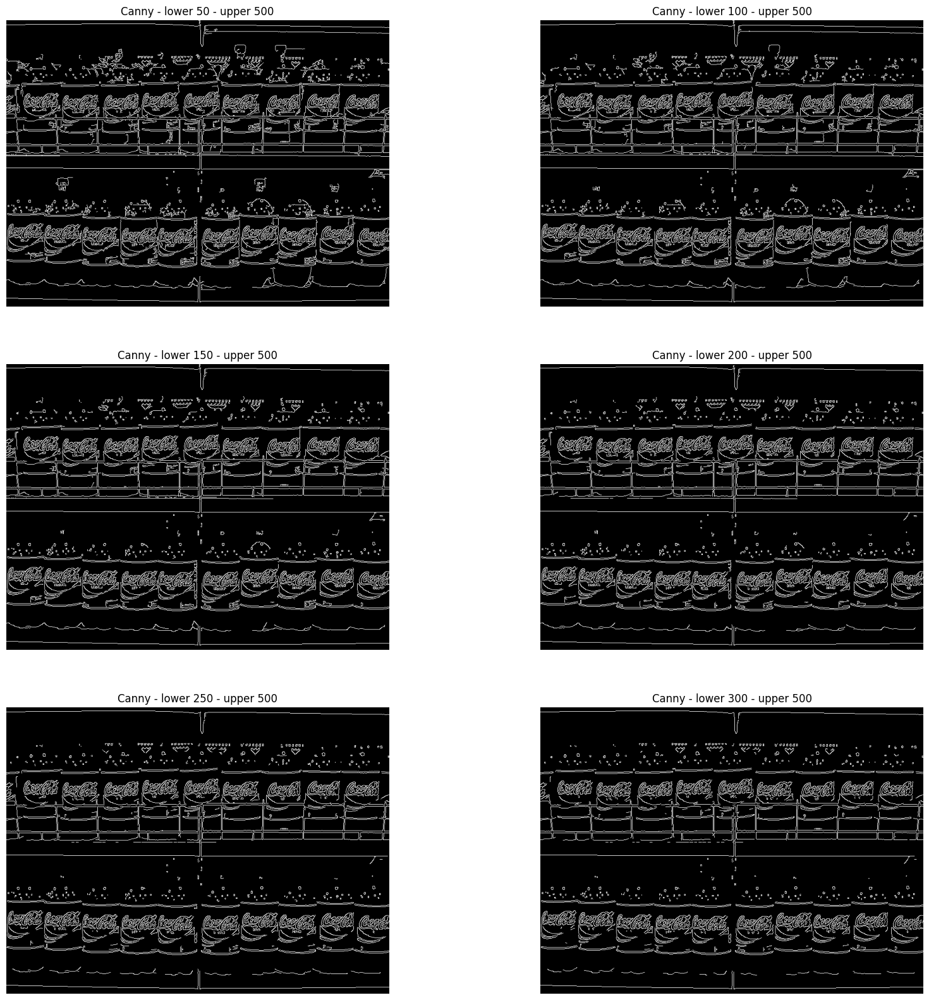

In [12]:
canny_50_x_500 = cv.Canny(imgMultiGrayScale, threshold1=50, threshold2=500)
canny_100_x_500 = cv.Canny(imgMultiGrayScale, threshold1=100, threshold2=500)
canny_150_x_500 = cv.Canny(imgMultiGrayScale, threshold1=150, threshold2=500)
canny_200_x_500 = cv.Canny(imgMultiGrayScale, threshold1=200, threshold2=500)
canny_250_x_500 = cv.Canny(imgMultiGrayScale, threshold1=250, threshold2=500)
canny_300_x_500 = cv.Canny(imgMultiGrayScale, threshold1=300, threshold2=500)
sv.plot_images_grid(
    images=[canny_50_x_500, canny_100_x_500,
            canny_150_x_500, canny_200_x_500,
            canny_250_x_500, canny_300_x_500],
    titles=["Canny - lower 50 - upper 500", "Canny - lower 100 - upper 500",
            "Canny - lower 150 - upper 500", "Canny - lower 200 - upper 500",
            "Canny - lower 250 - upper 500", "Canny - lower 300 - upper 500"],
    grid_size=(3 ,2),
    size=(20,20)
)

Se observa que los casos donde se utilizó un *lower threshold* de $200$, $250$ y $300$ con un *upper threshold* de $500$ los resultados presentan cierta similitud (en la parte del logo a detectar).

A partir de esto se decide utilizar un ***lower threshold*** de $200$ y un ***upper threshold*** de $500$ a la hora de trabajar con la imagen objetivo.

## Template Matching - Pruebas de distintas métricas y thresholds

### Análisis - Template Matching sobre imagen y template procesados

Se aplican los siguientes procesamientos:

***Template***

1. *Canny* con *lower threshold* de $5$ y *upper threshold* de $500$ sobre el template en *escala de grises*.
1. *Pirámides gaussianas* de nivel $1$ y $2$ sobre el resultado de aplicar *Canny*.

***Imagen objetivo***

1. *Canny* con *lower threshold* de $200$ y *upper threshold* de $500$ sobre la imagen en *escala de grises*.

***Estudios***

1. Template *Canny* vs Target *Canny*.
1. Template *Canny + Gauss 1* vs Target *Canny*.
1. Template *Canny + Gauss 2* vs Target *Canny*.

#### Variables y funciones útiles

In [13]:
# Template Matching class
templateMatchingPruebas = TemplateMatching(image=imgMulti, template=template)

In [14]:
### Configuraciones
# Target: Canny sin Gaussian
targetConfiguration = PreprocessingData(cannyLowerThreshold=200, cannyUpperThreshold=500, gaussianPyramidsMaxLevel=0)

# Template: Canny sin Gaussian
templateConfiguration_0 = PreprocessingData(cannyLowerThreshold=5, cannyUpperThreshold=500, gaussianPyramidsMaxLevel=0)

# Template: Canny con Gaussian nivel 1
templateConfiguration_1 = PreprocessingData(cannyLowerThreshold=5, cannyUpperThreshold=500, gaussianPyramidsMaxLevel=1)

# Template: Canny con Gaussian nivel 2
templateConfiguration_2 = PreprocessingData(cannyLowerThreshold=5, cannyUpperThreshold=500, gaussianPyramidsMaxLevel=2)

## Array para realizar diferentes pruebas
configs = [templateConfiguration_0, templateConfiguration_1, templateConfiguration_2]

In [15]:
def pruebas(metrica: int, metrica_str: str, threshold: float = 0.1):
    for templateConfiguration in configs:
        # Se realiza Preprocesamiento
        templateMatchingPruebas.preprocesar(imagePreprocessingData=targetConfiguration,
                                            templatePreprocessingData=templateConfiguration)
        
        temp_title = f"Template - Canny + Gaussian lvl = {templateConfiguration.gaussianPyramidsMaxLevel}"
        _, _ = templateMatchingPruebas.templateMatching(metrica=metrica, threshold=threshold,
                                                 template_title=temp_title,
                                                 target_title="Target",
                                                 final_title=f"Métrica: {metrica_str}")

#### Métrica: Coeficiente de Correlación Normalizado

En esta sección se estudia la métrica de `Coeficiente de Correlación Normalizado`, con un *threshold* inicial de $0.1$.

Se observa que al utilizar *Canny* + Pirámides Gaussianas de nivel $2$ muchas detecciones, por lo cual se procede a estudiar esta configuración con otros *thresholds* a fin de encontrar el *más adecuado*.

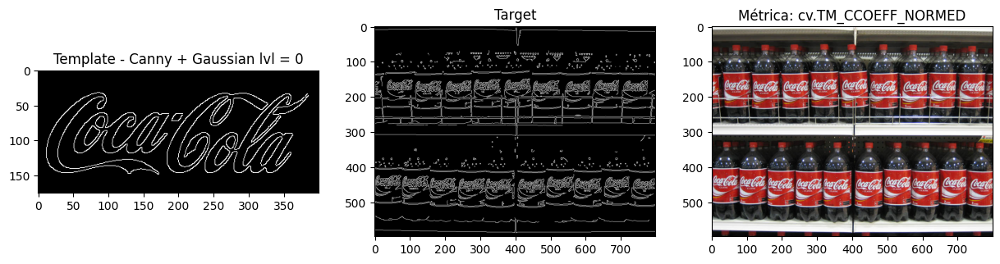

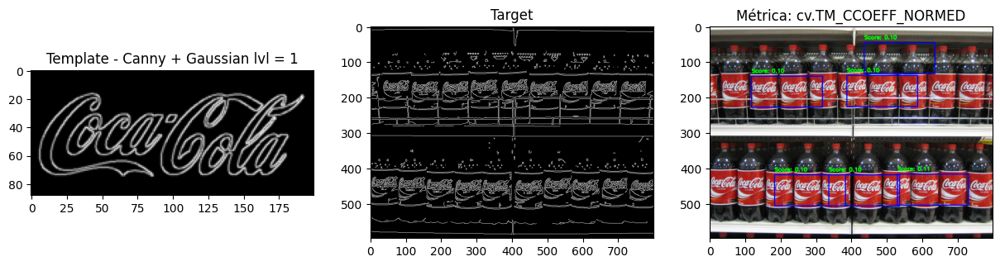

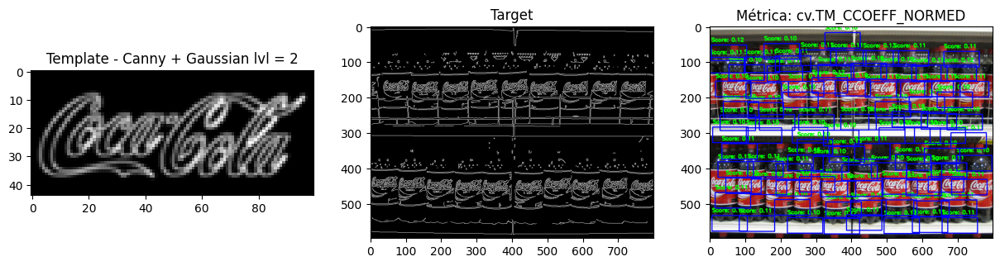

In [16]:
pruebas(metrica=cv.TM_CCOEFF_NORMED, metrica_str="cv.TM_CCOEFF_NORMED", threshold=0.1)

In [17]:
_ = templateMatchingPruebas.preprocesar(imagePreprocessingData=targetConfiguration, templatePreprocessingData=templateConfiguration_2)

Al aplicar un *threshold* de $0.2$ se nota que los resultados mejoraron, incluso sin que haya ***FALSOS POSITIVOS***.

Como se nota que hay $4$ casos en donde NO se detecta el template, se siguen estudiando otros *thresholds* sobre la misma configuración.

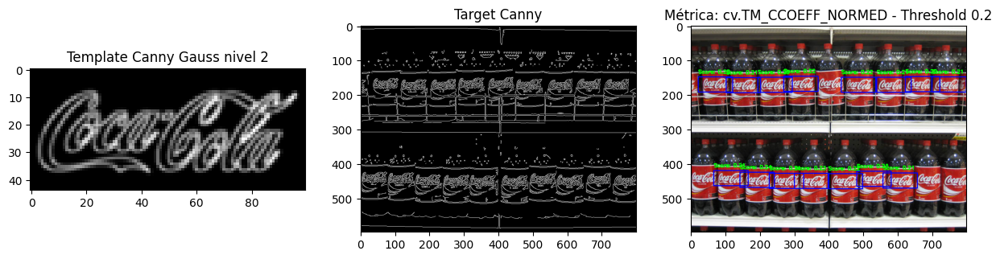

In [18]:
_, _ = templateMatchingPruebas.templateMatching(metrica=cv.TM_CCOEFF_NORMED, threshold=0.2, template_title="Template Canny Gauss nivel 2", target_title="Target Canny", final_title="Métrica: cv.TM_CCOEFF_NORMED - Threshold 0.2")

Al aplicar un *threshold* de $0.19$ se mejoran los resultados, reduciendo los casos en donde NO se detecta el template a $2$.

Se siguen estudiando otros *thresholds* sobre la misma configuración a fin de mejorar los resultados.

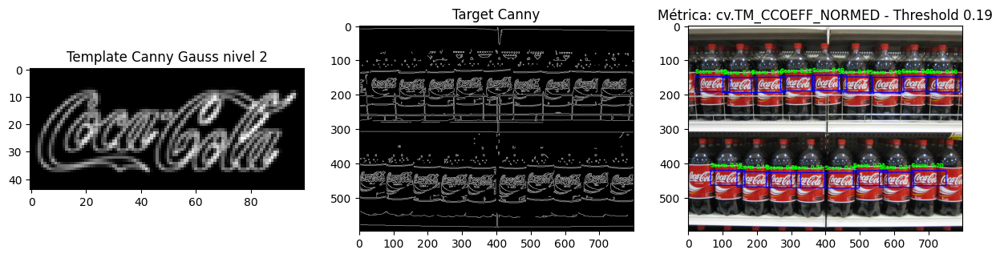

In [19]:
_, _ = templateMatchingPruebas.templateMatching(metrica=cv.TM_CCOEFF_NORMED, threshold=0.19, template_title="Template Canny Gauss nivel 2", target_title="Target Canny", final_title="Métrica: cv.TM_CCOEFF_NORMED - Threshold 0.19")

Al aplicar un *threshold* de $0.18$ aparece un ***FALSO POSITIVO***, sin mejoras en la detección de templates.

Por este motivo, se finalizan las pruebas de esta métrica.

Los mejores resultados para la métrica de `Coeficiente de Correlación Normalizado` se obtuvieron con un *threshold* de $0.19$.

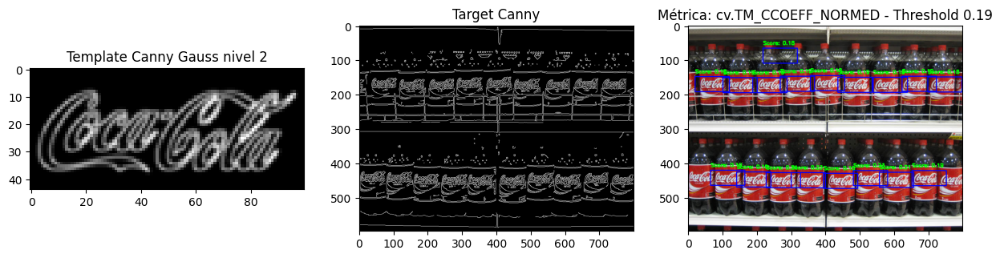

In [20]:
_, _ = templateMatchingPruebas.templateMatching(metrica=cv.TM_CCOEFF_NORMED, threshold=0.18, template_title="Template Canny Gauss nivel 2", target_title="Target Canny", final_title="Métrica: cv.TM_CCOEFF_NORMED - Threshold 0.19")

#### Métrica - Cross-Correlation Normalizada

En esta sección se estudia la métrica de `Cross-Correlation Normalizada`, con un *threshold* inicial de $0.1$.

Se observa que en todos los casos hay muchas detecciones, incluso habiendo ***FALSOS POSITIVOS***.

Se procede a estudiar esta configuración con otras *thresholds*, a fin de encontrar el más óptimo. A fin de facilitar las comparaciones con la métrica anterior, se decide enfocar las pruebas con la configuración que utiliza *Canny* y pirámides *Gaussianas* de nivel $2$.

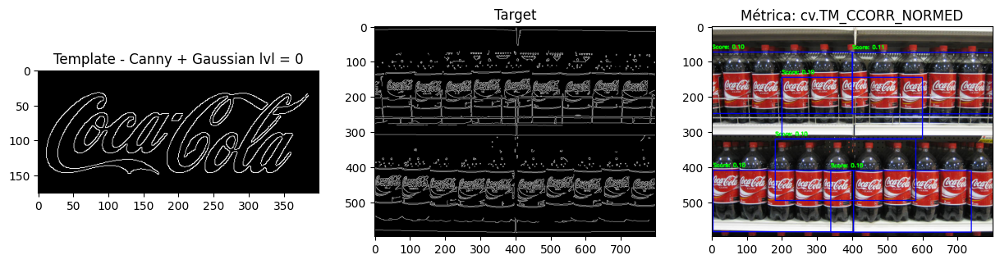

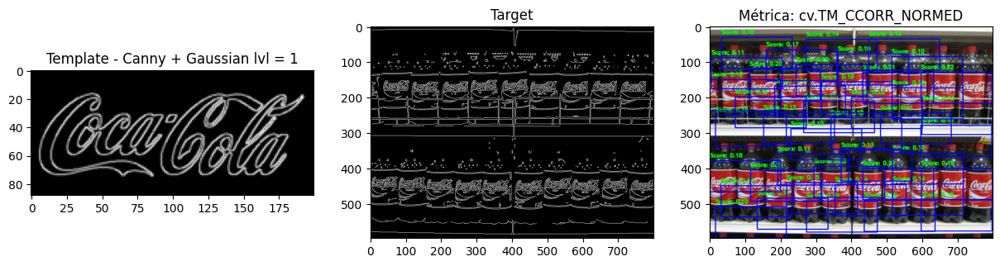

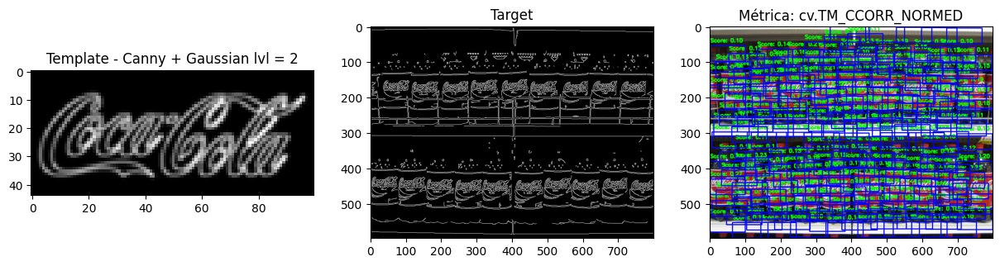

In [21]:
pruebas(metrica=cv.TM_CCORR_NORMED, metrica_str="cv.TM_CCORR_NORMED", threshold=0.1)

In [22]:
templateMatchingPruebas.preprocesar(imagePreprocessingData=targetConfiguration, templatePreprocessingData=templateConfiguration_2)

Con un *threshold* de $0.2$ sigue habiendo ***FALSOS POSITIVOS***. Por lo cual, se siguen estudiando otros valores.

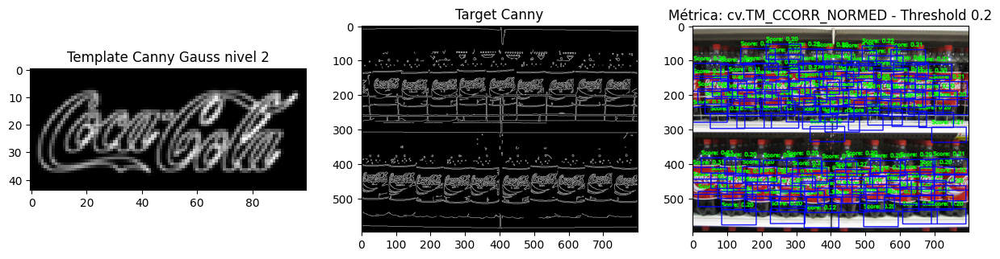

In [23]:
_, _ = templateMatchingPruebas.templateMatching(metrica=cv.TM_CCORR_NORMED, threshold=0.2, template_title="Template Canny Gauss nivel 2", target_title="Target Canny", final_title="Métrica: cv.TM_CCORR_NORMED - Threshold 0.2")

Con un *threshold* de $0.3$ los ***FALSOS POSITIVOS*** se reducen a $2$. Se siguen estudiando otros valores hasta encontrar un resultado óptimo.

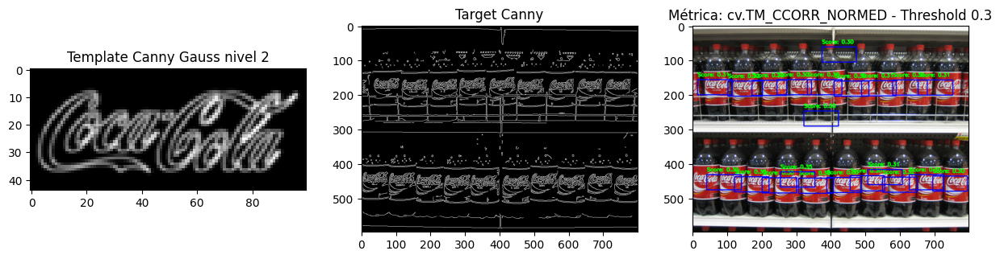

In [24]:
_, _ = templateMatchingPruebas.templateMatching(metrica=cv.TM_CCORR_NORMED, threshold=0.3, template_title="Template Canny Gauss nivel 2", target_title="Target Canny", final_title="Métrica: cv.TM_CCORR_NORMED - Threshold 0.3")

Con un *threshold* de $0.35$ los ***FALSOS POSITIVOS*** se reducen a $0$.

Igualmente, se observa que el algoritmo detecta los *templates* pero corridos a la izquierda, es decir, una parte del logo detectado corresponde a una botella, y la otra a otra botella.

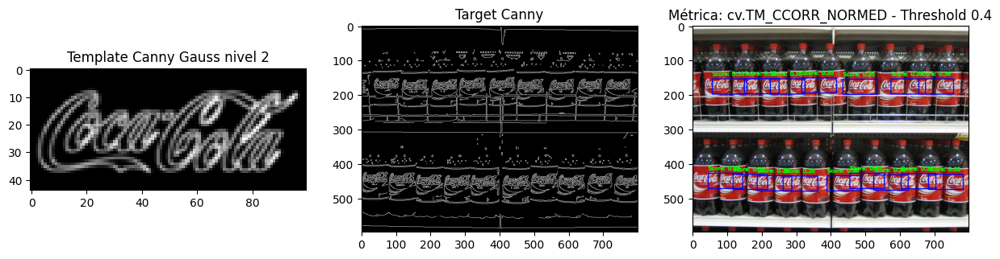

In [25]:
_, _ = templateMatchingPruebas.templateMatching(metrica=cv.TM_CCORR_NORMED, threshold=0.35, template_title="Template Canny Gauss nivel 2", target_title="Target Canny", final_title="Métrica: cv.TM_CCORR_NORMED - Threshold 0.4")

#### Métrica - Sumas diferencias al cuadrado Normalizada

Al estudiar esta métrica con un *threshold* de $1.0$, ya se detecta que hay muchas detecciones, la mayoría siendo ***FALSO POSITIVOS***.

Si se utiliza un *threshold* de $0.9$, no hay detecciones.

Se cree que esto puede deberse a que nuestro algoritmo utiliza *filtros de Canny* y *Pirámides Gaussianas*.

Por esto, se procede a analizar esta métrica pero sin implementar filtros de *Canny*, ya que estos podrían ser la causa de estos problemas.

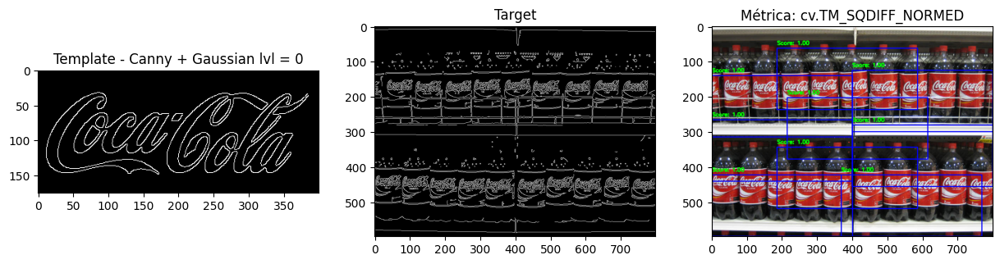

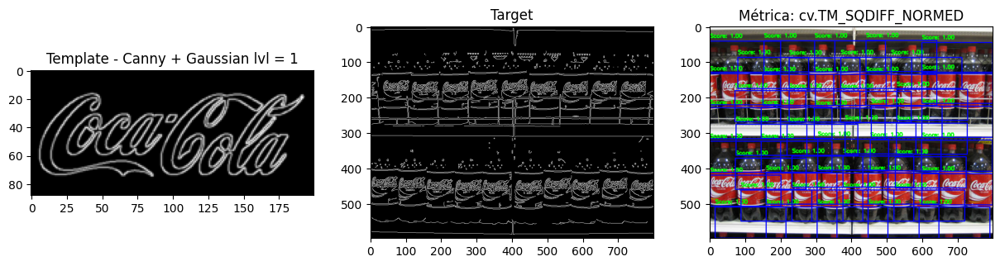

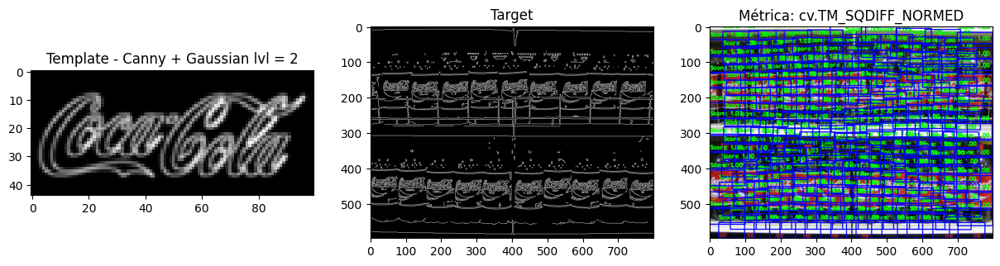

In [26]:
pruebas(metrica=cv.TM_SQDIFF_NORMED, metrica_str="cv.TM_SQDIFF_NORMED", threshold=1.0)

Caso de estudio correspondiente a un *threshold* de $0.9$.

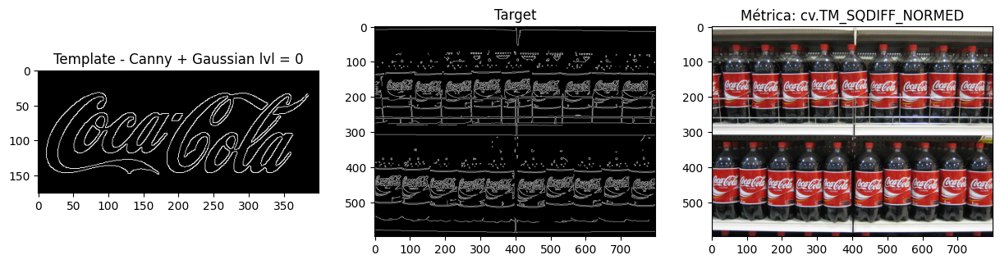

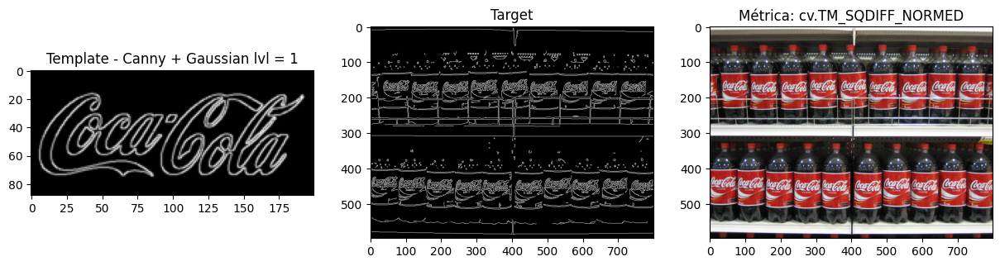

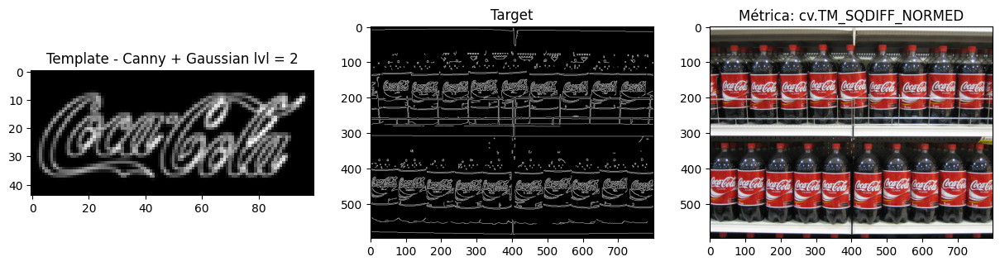

In [27]:
pruebas(metrica=cv.TM_SQDIFF_NORMED, metrica_str="cv.TM_SQDIFF_NORMED", threshold=0.9)

In [28]:
targetConfiguration_dif = PreprocessingData(cannyLowerThreshold=0, cannyUpperThreshold=0, gaussianPyramidsMaxLevel=0)

templateConfiguration_dif = PreprocessingData(cannyLowerThreshold=0, cannyUpperThreshold=0, gaussianPyramidsMaxLevel=2)

templateMatchingPruebas.preprocesar(imagePreprocessingData=targetConfiguration_dif, templatePreprocessingData=templateConfiguration_dif)

Al implementar esta nueva configuración con un *threshold* de $0.5$ se observa que hay varias detecciones, pero con muchos ***FALSOS POSITIVOS***.

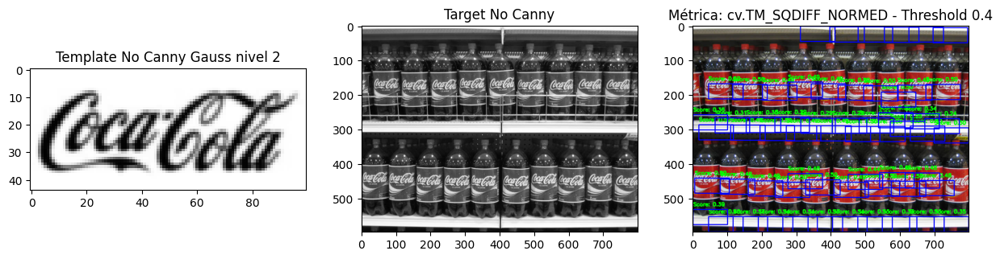

In [29]:
_, _ = templateMatchingPruebas.templateMatching(metrica=cv.TM_SQDIFF_NORMED, threshold=0.5, template_title="Template No Canny Gauss nivel 2", target_title="Target No Canny", final_title="Métrica: cv.TM_SQDIFF_NORMED - Threshold 0.4")

Al aumentar el *threshold* a $0.6$, los ***FALSOS POSITIVOS*** también aumentan.

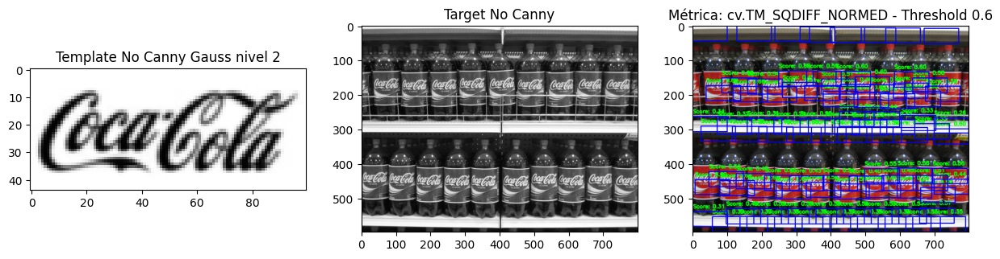

In [30]:
_, _ = templateMatchingPruebas.templateMatching(metrica=cv.TM_SQDIFF_NORMED, threshold=0.6, template_title="Template No Canny Gauss nivel 2", target_title="Target No Canny", final_title="Métrica: cv.TM_SQDIFF_NORMED - Threshold 0.6")

Al disminuir el *threshold* a $0.3$, los ***FALSOS POSITIVOS*** también disminuyen, pero no hay detecciones correctas.

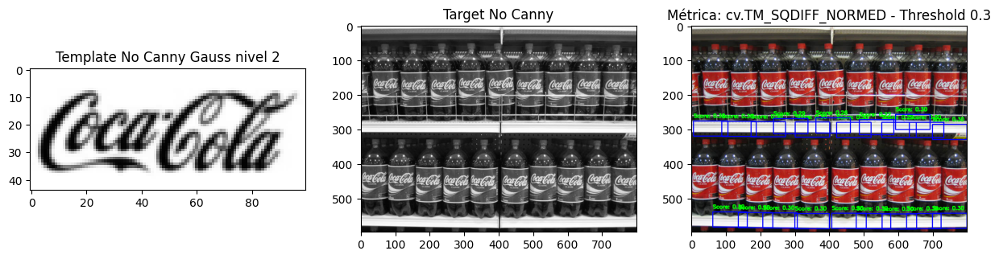

In [31]:
_, _ = templateMatchingPruebas.templateMatching(metrica=cv.TM_SQDIFF_NORMED, threshold=0.3, template_title="Template No Canny Gauss nivel 2", target_title="Target No Canny", final_title="Métrica: cv.TM_SQDIFF_NORMED - Threshold 0.3")

## Template Matching - Implementación y Conclusiones finales

### Implementación Final

In [32]:
template_path = "./material/template/pattern.png"
template = cv.imread(template_path)

img_multi_path = "./material/images/coca_multi.png"
imgMulti = cv.imread(img_multi_path)

In [33]:
templateMatching = TemplateMatching(image=imgMulti, template=template)

# Configuraciones
targetConfiguration = PreprocessingData(cannyLowerThreshold=200, cannyUpperThreshold=500, gaussianPyramidsMaxLevel=0)
templateConfiguration = PreprocessingData(cannyLowerThreshold=5, cannyUpperThreshold=500, gaussianPyramidsMaxLevel=2)

# Preprocesamiento
templateMatching.preprocesar(imagePreprocessingData=targetConfiguration, templatePreprocessingData=templateConfiguration)

In [34]:
threshold = 0.19
resultado, scores = templateMatching.templateMatching(metrica=cv.TM_CCOEFF_NORMED, threshold=threshold, template_title="Template - Canny - Gauss nivel 2", target_title="Target - Canny", final_title=f"Métrica: Coeficiente de correlación normalizado - Threshold {threshold}", graficar=False)

In [ ]:
img_final = templateMatching.originalImage.copy()

resultado_ordenado = sorted(resultado, key=lambda x: x[0])

i_sup = 0
i_inf = 0

sep_filas = 200

for (startX, startY, endX, endY) in resultado_ordenado:
    
    # Defino colores
    green_color = (22, 168, 53)
    blue_color = (0, 0, 255)
    score_border_color = (255, 255, 255)

    # Permite intercalar los colores de los rectángulos,
    # para mayor legibilidad.
    if startY < sep_filas:
        colors = blue_color if i_sup%2==0 else green_color
        i_sup += 1
    else:
        colors = blue_color if i_inf%2==0 else green_color
        i_inf += 1

    # Bounding Box
    cv.rectangle(img_final, (startX, startY), (endX, endY),
                 colors, 3)

    # Obtengo el score
    score = scores[startY,startX]    
    label_text = f"{score:.2f}"
    
    # Muestro los scores en Bounding Boxes
    text_thickness_border = 5
    text_thickness_main = 2

    cv.putText(img_final, label_text, (startX, startY - 10),
               cv.FONT_HERSHEY_SIMPLEX, 0.5, score_border_color,
               text_thickness_border, cv.LINE_AA)
    cv.putText(img_final, label_text, (startX, startY - 10),
               cv.FONT_HERSHEY_SIMPLEX, 0.5, colors,
               text_thickness_main, cv.LINE_AA)

### Conclusiones finales

En este ejericio se estudió la ténica de template matching, aplicándo un template determinado sobre una imagen que contiene varias *instancias* del mismo.

***Preprocesamiento***

Se comenzó con un preprocesamiento del template y de la imagen objetivo.

En el caso del *template*, se estudió el uso de *bordes de Canny* aplicado sobre éste en escala de grises. <br/>
Estos facilitan la detección del template, especialmente al utilizar métricas basadas en correlaciones. <br/>
Se estudiaron diversos *lower* y *upper* thresholds, determinando que aquellos en donde el resultado era "más legible" son un *lower threshold* de $5$ y un *upper threshold* de $500$.

Sobre ésta imagen sin bordes se aplicaron *pirámides gaussianas* de nivel $1$, $2$ y $3$. <br/>
Esto permite detectar al template en la imagen target en caso de que este aparezca con dimensiones reducidas. <br/>
Las pirámides de nivel $3$ se caracterizaban por estar distorsionadas. Por esto, se opta por utilizar un nivel $2$, es decir, reducir el template original a un cuarto del mismo. <br/>

En cuanto a la imagen target, solamente se estudio el uso de *bordes de Canny*. <br/>
Los mejores resultados se obtuvieron con un *lower threshold* de $200$ y un *upper threshold* de $500$. <br/>
Se optó también por NO utilizar pirámides gaussianas, ya que una imagen target reducida implicaría necesitar un template reducido, incluso en niveles mayores a $2$, los cuales para nuestro template podrían resultar poco prácticos, ya que el resultado es distorsionado.

***Template Matching***

Nuestro algoritmo se encuentra definido en el método `templateMatching` de la clase [TemplateMatching](../utilities/template_matching.py).

Este se caracteriza porque permite detectar la aparición de un template ***multiples veces*** en la misma imagen.

Requiere que se haya realizado un *preprocesamiento* sobre el template y la imagen target a utilizar.

En particular, el procesamiento que se estudia implica que tanto el template y la imagen utilicen extracción *bordes de Canny*. Esto hará que los valores de los bordes del logo a detectar, tanto en el template como en la imagen target, sean *ceros*, lo cual beneficia a métricas basadas en correlaciones, que implican una multiplicación de los valores de píxeles. De esta manera, el algoritmo podrá detectar matcheos cuando la correlación pase de un valor alto a cero (cuando coinciden los bordes de la imagen y el template).

El uso de pirámides gaussianas en el template facilita la detección de este en la imagen target, ya que el template aparece en la misma pero en dimensión reducida.

Una vez hecho el matcheo, se filtran los resultados utilizando *no Max Supression* ([Fuente](https://pyimagesearch.com/2015/02/16/faster-non-maximum-suppression-python/)) a fin de que haya un solo *rectángulo* por logo detectado.

***Métricas***

Se estudiaron las métricas de `Coeficiente de Correlación Normalizado`, `Cross-Correlation Normalizada` y `Sumas de diferencias al cuadrado Normalizada`.

Las dos primeras métricas se estudiaron con la configuración correspondiente a *Canny* + *Pirámides Gaussianas de nivel 2* para el template, y *Canny* para el target.

Respecto a la métrica de `Sumas de diferencias al cuadrado Normalizada`, ésta no se vió beneficiado por el uso de *Canny*, por lo cual solo se usaron *Pirámides Gaussianas de nivel 2* en el template.

En cada caso de estudio se iteró sobre diferentes *thresholds* para determinar el más óptimo, es decir, el que permite la mayor cantidad de detecciones sin ***FALSOS POSITIVOS***.

***Resultados***

El mejor resultado se obtuvo con la métrica de `Coeficiente de Correlación Normalizado`, con un *threshold* de $0.19$.

Se caracteriza por no presentar Falsos Positivos, y por detectar el logo de *Coca-Cola* en casi todas las botellas de la imagen target, salvo en dos, que son la primera y la última de la fila inferior.

El logo de la última botella posiblemente *NO* es detectado debido a que éste aparece cortado (la última sílaba de *Cola*), motivo por el cual el template no matchea del todo.

El logo de la primer botella en cambio *SI* debió ser detectado.

***Conclusiones***

Mediante este estudio se demuestra la utilidad que aportan diversas técnicas de preprocesamiento tanto en el *template* como en el *target* utilizados en un algoritmo de *Template Matching multiple*.

En particular, se destaca el uso de extracción de bordes de *Canny*, la cual favorece métricas basadas en la *correlación* (como `Coeficiente de Correlación Normalizado`), como así también la técnica de *pirámides gaussianas* aplicada en el template, especialmente para los casos en donde la imagen target presenta una o más instancias del template pero en dimensión reducida.


A continuación se muestran las instancias de templates detectadas en la imagen target junto con su score.

Nótese que el score NO representa una probabilidad, sino que es el resultado de aplicar una correlación.

Text(0.5, 1.0, 'Métrica: Coeficiente de correlación normalizado - Threshold 0.19')

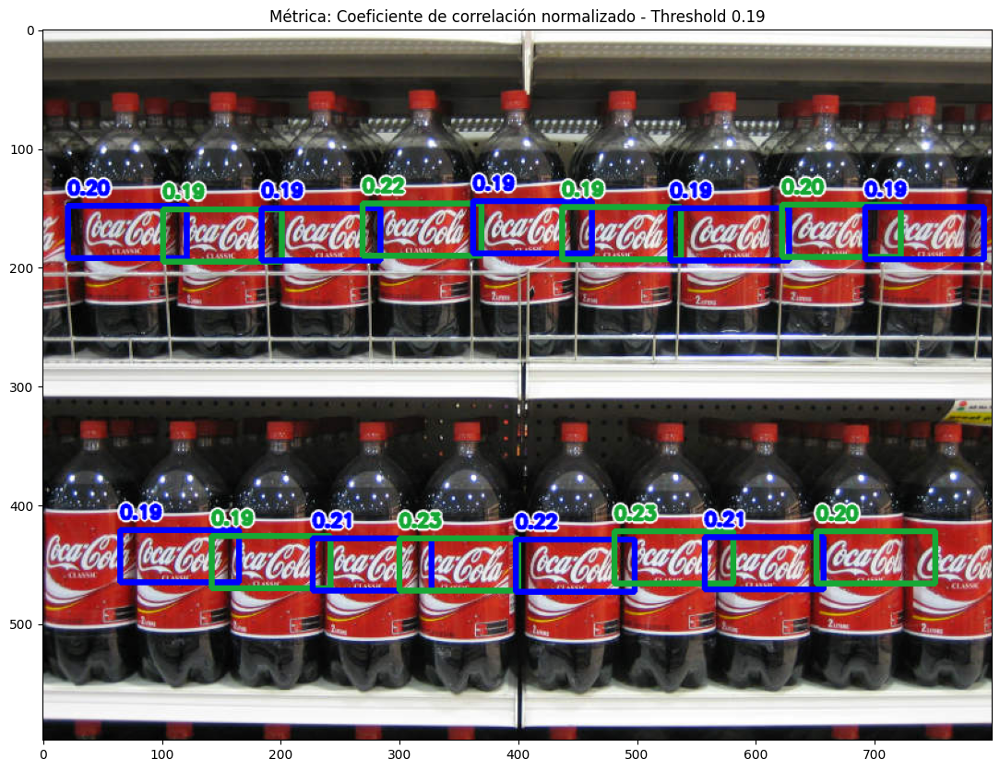

In [46]:
plt.figure(figsize=(20,10))
plt.imshow(img_final)
plt.title(f"Métrica: Coeficiente de correlación normalizado - Threshold {threshold}")